# PyORBIT output.mat comparison
02: Mini simulation scan using measured tomo longitudinal distribution

In [1]:
import os
import glob
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

In [2]:
plt.rcParams['figure.figsize'] = [9.0, 8.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 8

plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 5

In [3]:
def round_sig(x, sig=3):
        return round(x, sig-int(floor(log10(abs(x))))-1)

def replace_point_with_p(input_str):
        return input_str.replace(".", "p")
    
def is_non_zero_file(fpath):  
        print('\n\t\t\tis_non_zero_file:: Checking file ', fpath)
        print('\n\t\t\tis_non_zero_file:: File exists = ', os.path.isfile(fpath))
        print('\n\t\t\tis_non_zero_file:: Size > 3 bytes = ', os.path.getsize(fpath))
        return os.path.isfile(fpath) and os.path.getsize(fpath) > 3

In [4]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print('\tAdded output data from ', filename, '\t dictionary key: ', label)
	return dd

In [5]:
def make_directory(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)  

In [6]:
dd1 = dict() # NoSC H
dd2 = dict() # SC H
dd3 = dict() # NoSC V
dd4 = dict() # SC V

dd1 = add_input_file(dd1, '0_H_07/output/output.mat', '6.07')
#dd1 = add_input_file(dd1, '0_H_08/output/output.mat', '6.08')
dd1 = add_input_file(dd1, '0_H_09/output/output.mat', '6.09')
#dd1 = add_input_file(dd1, '0_H_10/output/output.mat', '6.10')
dd1 = add_input_file(dd1, '0_H_11/output/output.mat', '6.11')
#dd1 = add_input_file(dd1, '0_H_12/output/output.mat', '6.12')
dd1 = add_input_file(dd1, '0_H_13/output/output.mat', '6.13')
#dd1 = add_input_file(dd1, '0_H_14/output/output.mat', '6.14')
dd1 = add_input_file(dd1, '0_H_15/output/output.mat', '6.15')
#dd1 = add_input_file(dd1, '0_H_16/output/output.mat', '6.16')
dd1 = add_input_file(dd1, '0_H_17/output/output.mat', '6.17')
#dd1 = add_input_file(dd1, '0_H_18/output/output.mat', '6.18')
dd1 = add_input_file(dd1, '0_H_19/output/output.mat', '6.19')
#dd1 = add_input_file(dd1, '0_H_20/output/output.mat', '6.20')
dd1 = add_input_file(dd1, '0_H_21/output/output.mat', '6.21')

dd2 = add_input_file(dd2, '1_H_07/output/output.mat', '6.07')
#dd2 = add_input_file(dd2, '1_H_08/output/output.mat', '6.08')
dd2 = add_input_file(dd2, '1_H_09/output/output.mat', '6.09')
#dd2 = add_input_file(dd2, '1_H_10/output/output.mat', '6.10')
dd2 = add_input_file(dd2, '1_H_11/output/output.mat', '6.11')
#dd2 = add_input_file(dd2, '1_H_12/output/output.mat', '6.12')
dd2 = add_input_file(dd2, '1_H_13/output/output.mat', '6.13')
#dd2 = add_input_file(dd2, '1_H_14/output/output.mat', '6.14')
dd2 = add_input_file(dd2, '1_H_15/output/output.mat', '6.15')
#dd2 = add_input_file(dd2, '1_H_16/output/output.mat', '6.16')
dd2 = add_input_file(dd2, '1_H_17/output/output.mat', '6.17')
#dd2 = add_input_file(dd2, '1_H_18/output/output.mat', '6.18')
dd2 = add_input_file(dd2, '1_H_19/output/output.mat', '6.19')
#dd2 = add_input_file(dd2, '1_H_20/output/output.mat', '6.20')
dd2 = add_input_file(dd2, '1_H_21/output/output.mat', '6.21')

dd3 = add_input_file(dd3, '0_V_10/output/output.mat', '6.10')
#dd3 = add_input_file(dd3, '0_V_11/output/output.mat', '6.11')
dd3 = add_input_file(dd3, '0_V_12/output/output.mat', '6.12')
#dd3 = add_input_file(dd3, '0_V_13/output/output.mat', '6.13')
dd3 = add_input_file(dd3, '0_V_14/output/output.mat', '6.14')
#dd3 = add_input_file(dd3, '0_V_15/output/output.mat', '6.15')
dd3 = add_input_file(dd3, '0_V_16/output/output.mat', '6.16')
#dd3 = add_input_file(dd3, '0_V_17/output/output.mat', '6.17')
dd3 = add_input_file(dd3, '0_V_18/output/output.mat', '6.18')
#dd3 = add_input_file(dd3, '0_V_19/output/output.mat', '6.19')
dd3 = add_input_file(dd3, '0_V_20/output/output.mat', '6.20')
#dd3 = add_input_file(dd3, '0_V_21/output/output.mat', '6.21')
dd3 = add_input_file(dd3, '0_V_22/output/output.mat', '6.22')
#dd3 = add_input_file(dd3, '0_V_23/output/output.mat', '6.23')
dd3 = add_input_file(dd3, '0_V_24/output/output.mat', '6.24')

dd4 = add_input_file(dd4, '1_V_10/output/output.mat', '6.10')
#dd4 = add_input_file(dd4, '1_V_11/output/output.mat', '6.11')
dd4 = add_input_file(dd4, '1_V_12/output/output.mat', '6.12')
#dd4 = add_input_file(dd4, '1_V_13/output/output.mat', '6.13')
dd4 = add_input_file(dd4, '1_V_14/output/output.mat', '6.14')
#dd4 = add_input_file(dd4, '1_V_15/output/output.mat', '6.15')
dd4 = add_input_file(dd4, '1_V_16/output/output.mat', '6.16')
#dd4 = add_input_file(dd4, '1_V_17/output/output.mat', '6.17')
dd4 = add_input_file(dd4, '1_V_18/output/output.mat', '6.18')
#dd4 = add_input_file(dd4, '1_V_19/output/output.mat', '6.19')
dd4 = add_input_file(dd4, '1_V_20/output/output.mat', '6.20')
#dd4 = add_input_file(dd4, '1_V_21/output/output.mat', '6.21')
dd4 = add_input_file(dd4, '1_V_22/output/output.mat', '6.22')
#dd4 = add_input_file(dd4, '1_V_23/output/output.mat', '6.23')
dd4 = add_input_file(dd4, '1_V_24/output/output.mat', '6.24')


	Added output data from  0_H_07/output/output.mat 	 dictionary key:  6.07
	Added output data from  0_H_09/output/output.mat 	 dictionary key:  6.09
	Added output data from  0_H_11/output/output.mat 	 dictionary key:  6.11
	Added output data from  0_H_13/output/output.mat 	 dictionary key:  6.13
	Added output data from  0_H_15/output/output.mat 	 dictionary key:  6.15
	Added output data from  0_H_17/output/output.mat 	 dictionary key:  6.17
	Added output data from  0_H_19/output/output.mat 	 dictionary key:  6.19
	Added output data from  0_H_21/output/output.mat 	 dictionary key:  6.21
	Added output data from  1_H_07/output/output.mat 	 dictionary key:  6.07
	Added output data from  1_H_09/output/output.mat 	 dictionary key:  6.09
	Added output data from  1_H_11/output/output.mat 	 dictionary key:  6.11
	Added output data from  1_H_13/output/output.mat 	 dictionary key:  6.13
	Added output data from  1_H_15/output/output.mat 	 dictionary key:  6.15
	Added output data from  1_H_17/output

In [7]:
dd1['6.07'].keys()

dict_keys(['__header__', '__version__', '__globals__', 'eps_z', 'D_x', 'D_y', 'mu_y', 'kurtosis_yp_6sig', 'kurtosis_yp', 'kurtosis_y', 'intensity', 'mu_yp', 'kurtosis_z_6sig', 'min_yp', 'cumulative_time', 'eff_beta_y', 'eff_beta_x', 'kurtosis_y_6sig', 'kurtosis_x', 'min_x', 'mu_z', 'epsn_y', 'epsn_x', 'beta_y', 'beta_x', 'max_xp', 'mean_yp', 'sig_dE', 'dpp_rms', 'kurtosis_xp', 'eff_epsn_y', 'eff_epsn_x', 'mean_x', 'mean_y', 'mean_z', 'min_dE', 'kurtosis_x_6sig', 'max_z', 'mu_dE', 'max_x', 'max_y', 'n_mp', 'mean_dE', 'min_y', 'kurtosis_xp_6sig', 'sig_yp', 'sig_y', 'sig_x', 'min_xp', 'max_yp', 'kurtosis_z', 'eff_alpha_x', 'eff_alpha_y', 'mu_xp', 'turn_time', 'alpha_x', 'alpha_y', 'mean_xp', 'bunchlength', 'turn_duration', 'sig_z', 'kurtosis_dE', 'mu_x', 'turn', 'sig_xp', 'max_dE', 'kurtosis_dE_6sig', 'min_z', 'gamma'])

In [8]:
make_directory('Plots')

Creation of the directory Plots failed


In [9]:
sc = 'SbS'
legend_label1 = r'$Q_x$'  
legend_label2 = r'$Q_y$'   
main_label = 'MD4224_Light'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 30
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
#betagamma = 2.492104532 * 0.9159915293879255
save_folder = 'Plots'
title_2 = 'No Space Charge'
title_1 = 'Space Charge'
case_label_1 = r'Horizontal Scan ($Q_y$ = 6.24)'
case_label_2 = r'Vertical Scan ($Q_x$ = 6.21)'

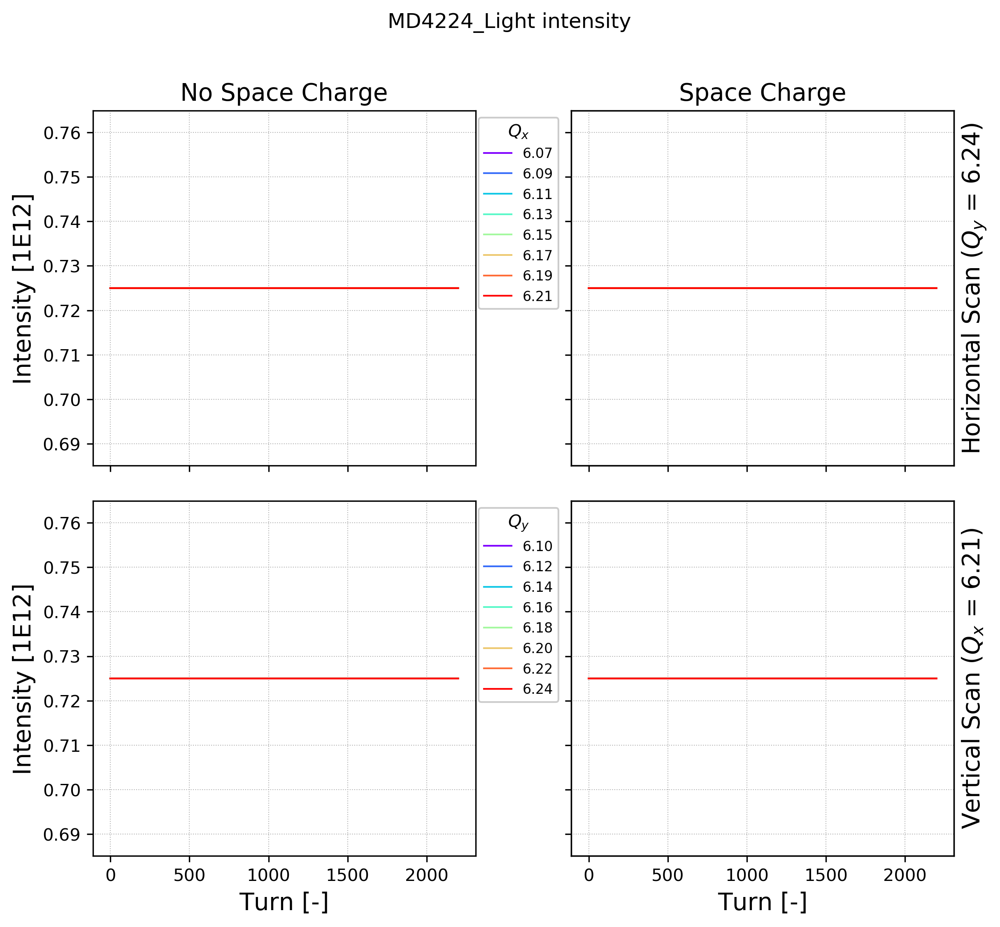

In [10]:
parameter = 'intensity'
multi1 = 1E-12

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Intensity [1E12]');
ax3.set_ylabel('Intensity [1E12]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

6.07
6.09
6.11
6.13
6.15
6.17
6.19
6.21


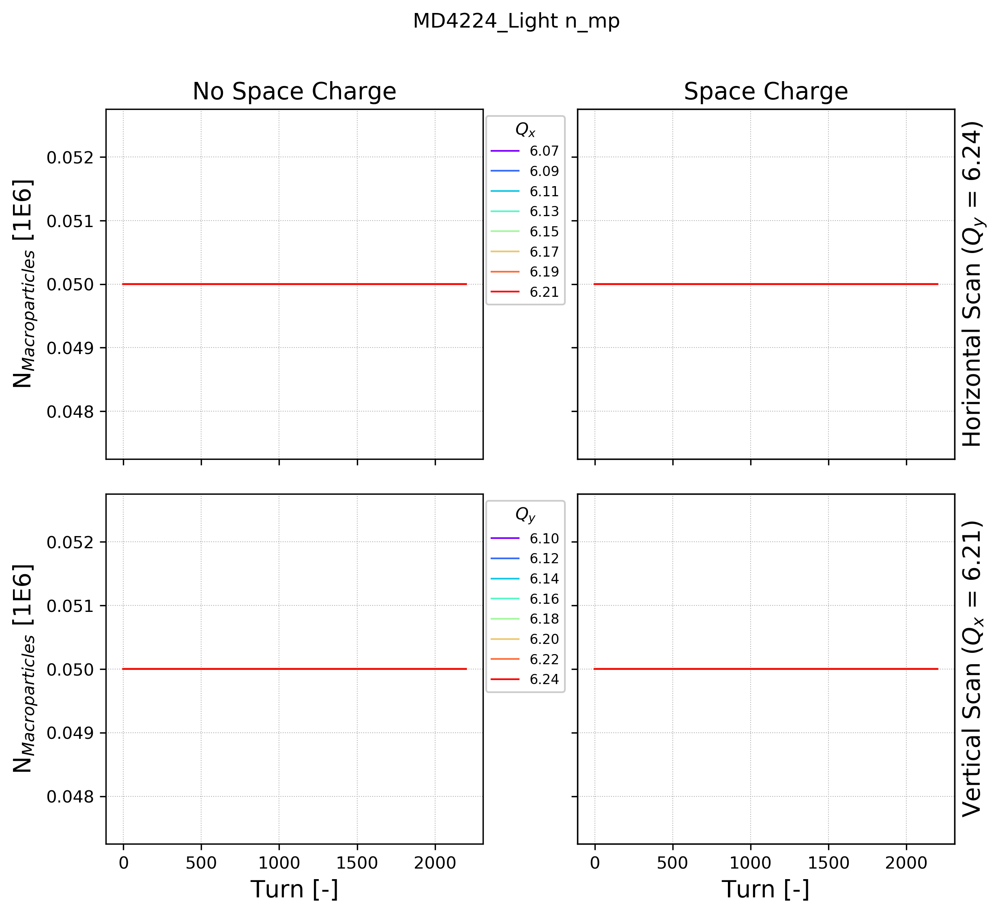

In [14]:
parameter = 'n_mp'
multi1 = 1E-6

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

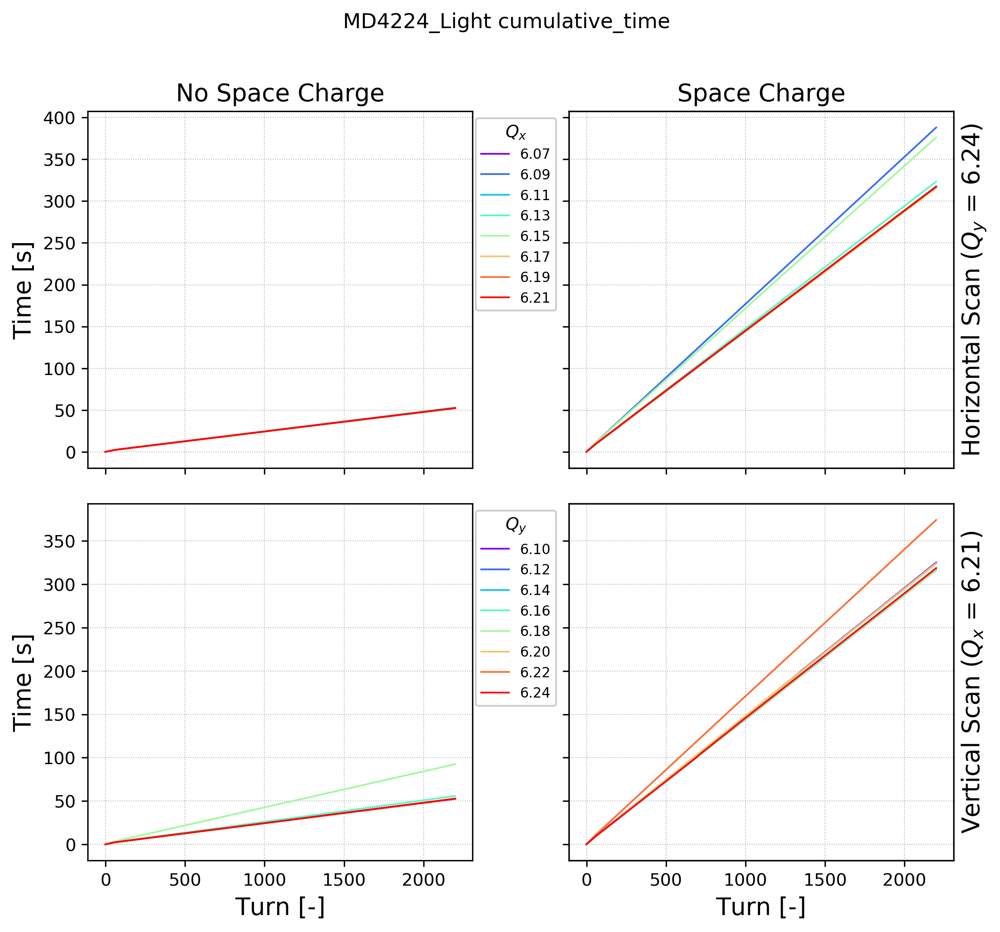

In [15]:
parameter = 'cumulative_time'
multi1 = 1./60.

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time [s]');
ax3.set_ylabel('Time [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax5.set_ylabel(case_label_1);
ax6.set_ylabel(case_label_2);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

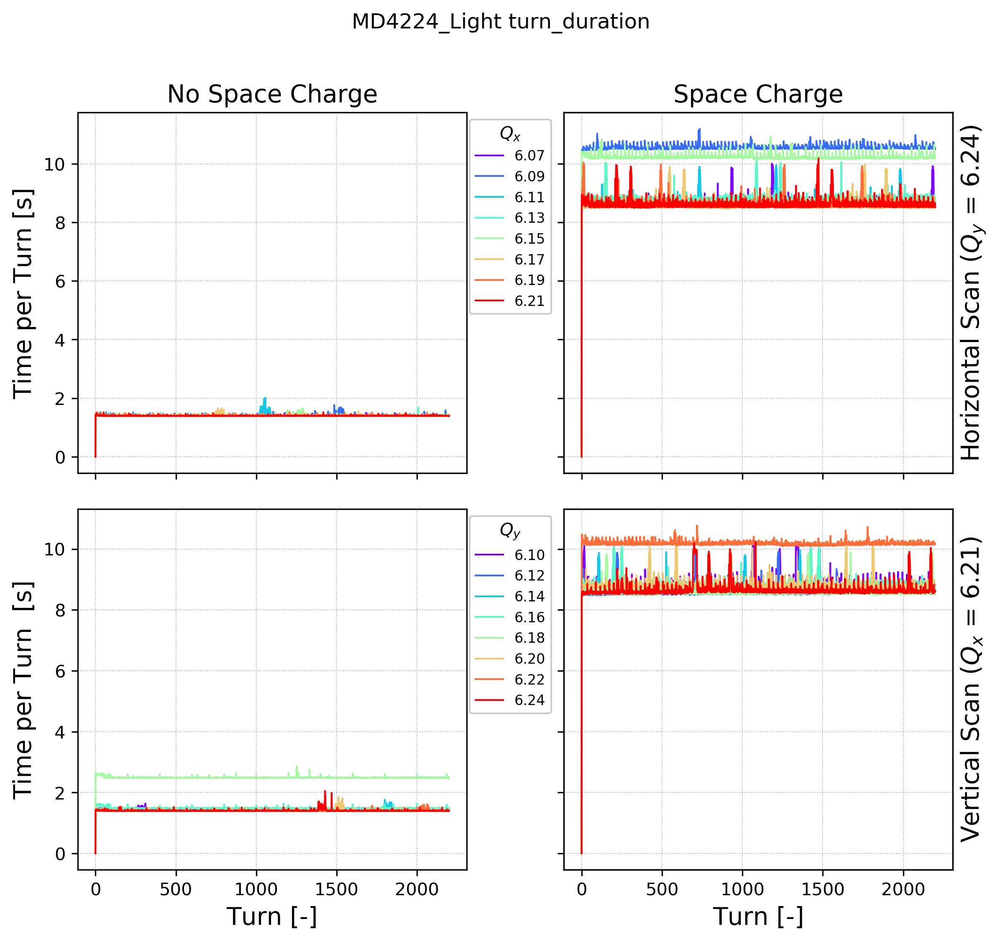

In [16]:
parameter = 'turn_duration'
multi1 = 1

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time per Turn [s]');
ax3.set_ylabel('Time per Turn  [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_x  =  4.02  range =  0.964  =  24.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_x  =  4.03  range =  0.622  =  15.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_x  =  4.04  range =  0.398  =  9.85 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_x  =  4.04  range =  0.245  =  6.069999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_x  =  4.04  range =  0.149  =  3.6799999999999997 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  sig_x  =  4.04  range =  0.087  =  2.15 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  sig_x  =  4.04  range =  0.0743  =  1.8399999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  sig_x  =  4.03  range =  0.0757  =  1.8800000000000001 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_x  =  6.57  range =  

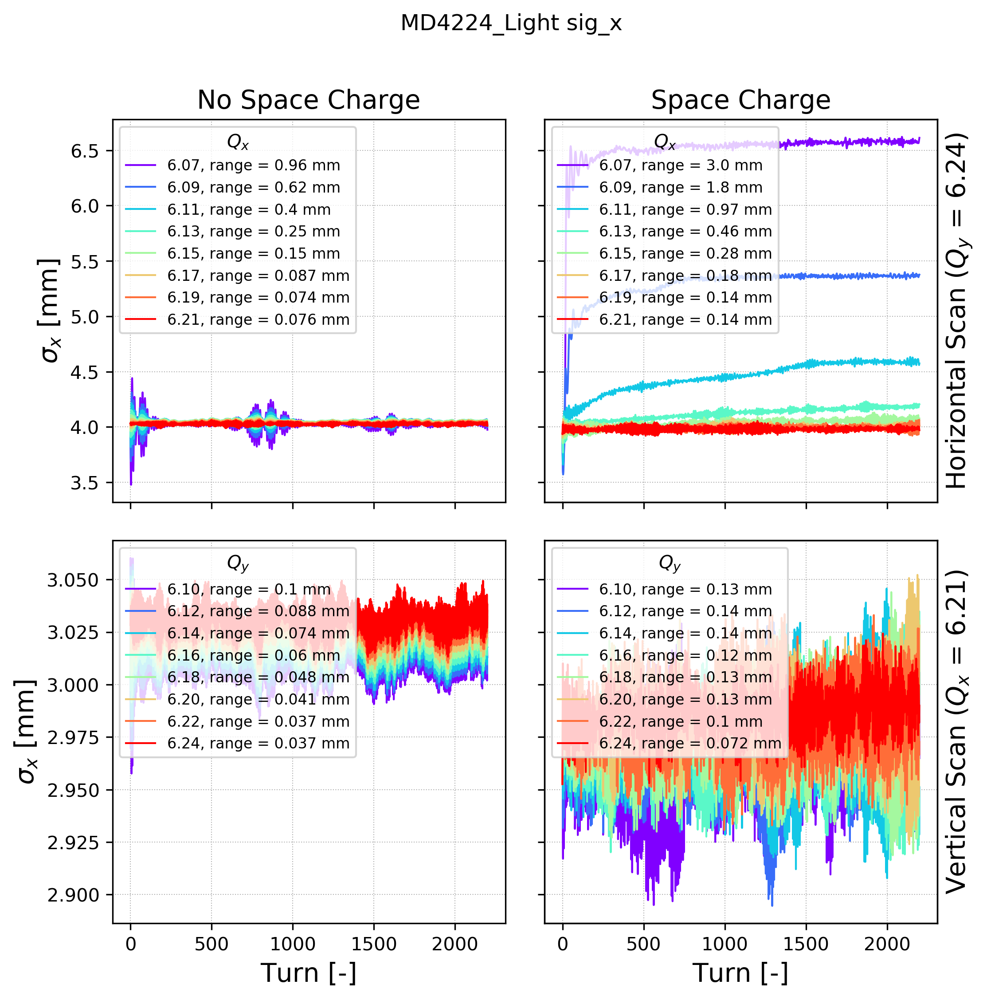

In [18]:
full_labels = True
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_x'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()  

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_xp  =  0.15  range =  0.0197  =  13.200000000000001 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_xp  =  0.144  range =  0.00845  =  5.88 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_xp  =  0.141  range =  0.00409  =  2.9000000000000004 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_xp  =  0.14  range =  0.0024  =  1.72 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_xp  =  0.139  range =  0.00211  =  1.52 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  sig_xp  =  0.139  range =  0.00202  =  1.46 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  sig_xp  =  0.138  range =  0.00216  =  1.5599999999999998 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  sig_xp  =  0.138  range =  0.00213  =  1.54 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_xp  =  0

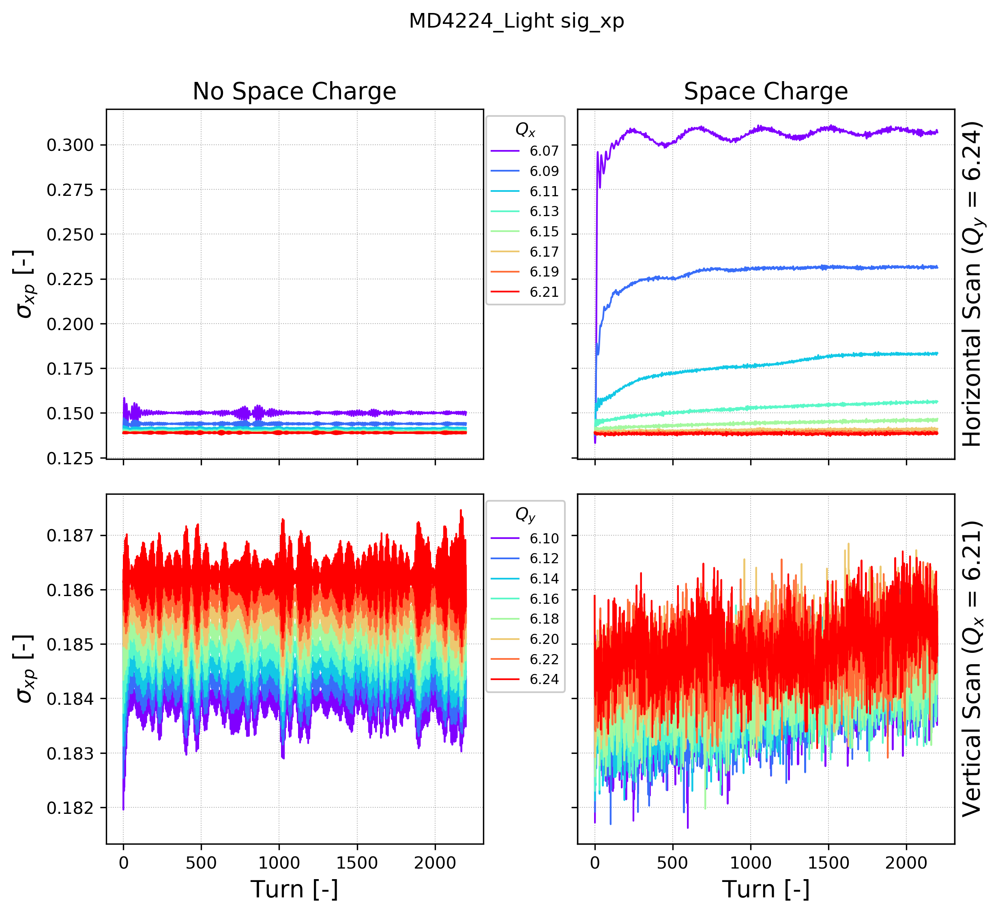

In [20]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_xp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_y  =  2.22  range =  0.0715  =  3.2199999999999998 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_y  =  2.22  range =  0.0593  =  2.67 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_y  =  2.23  range =  0.0473  =  2.12 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_y  =  2.23  range =  0.0355  =  1.59 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_y  =  2.24  range =  0.0274  =  1.22 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  sig_y  =  2.24  range =  0.0273  =  1.22 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  sig_y  =  2.24  range =  0.0269  =  1.2 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  sig_y  =  2.25  range =  0.0266  =  1.18 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_y  =  2.26  range =  0.08  =  3.54 %
Space Charge   Horiz

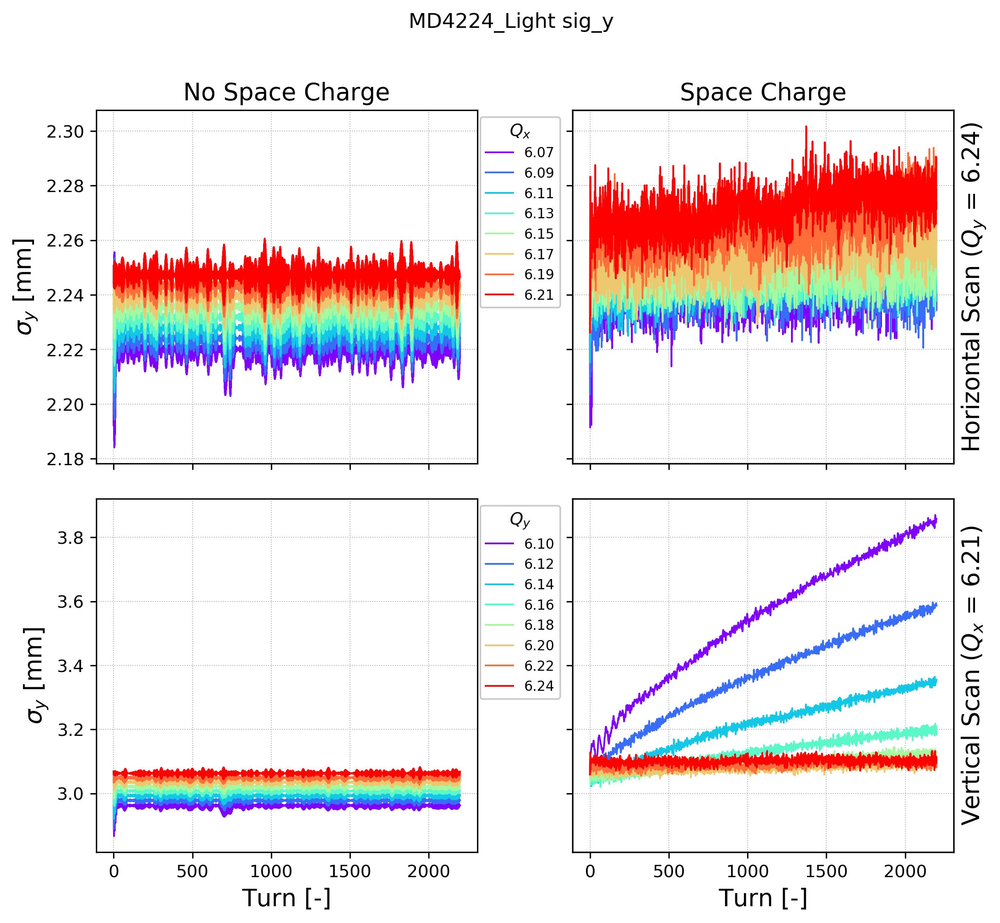

In [21]:
full_labels = False
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_y'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_yp  =  0.198  range =  0.00639  =  3.2199999999999998 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_yp  =  0.198  range =  0.00527  =  2.6599999999999997 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_yp  =  0.197  range =  0.00417  =  2.11 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_yp  =  0.197  range =  0.00311  =  1.58 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_yp  =  0.197  range =  0.00239  =  1.21 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  sig_yp  =  0.196  range =  0.00236  =  1.2 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  sig_yp  =  0.196  range =  0.00232  =  1.18 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  sig_yp  =  0.196  range =  0.00227  =  1.16 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_yp  =  0.196  range

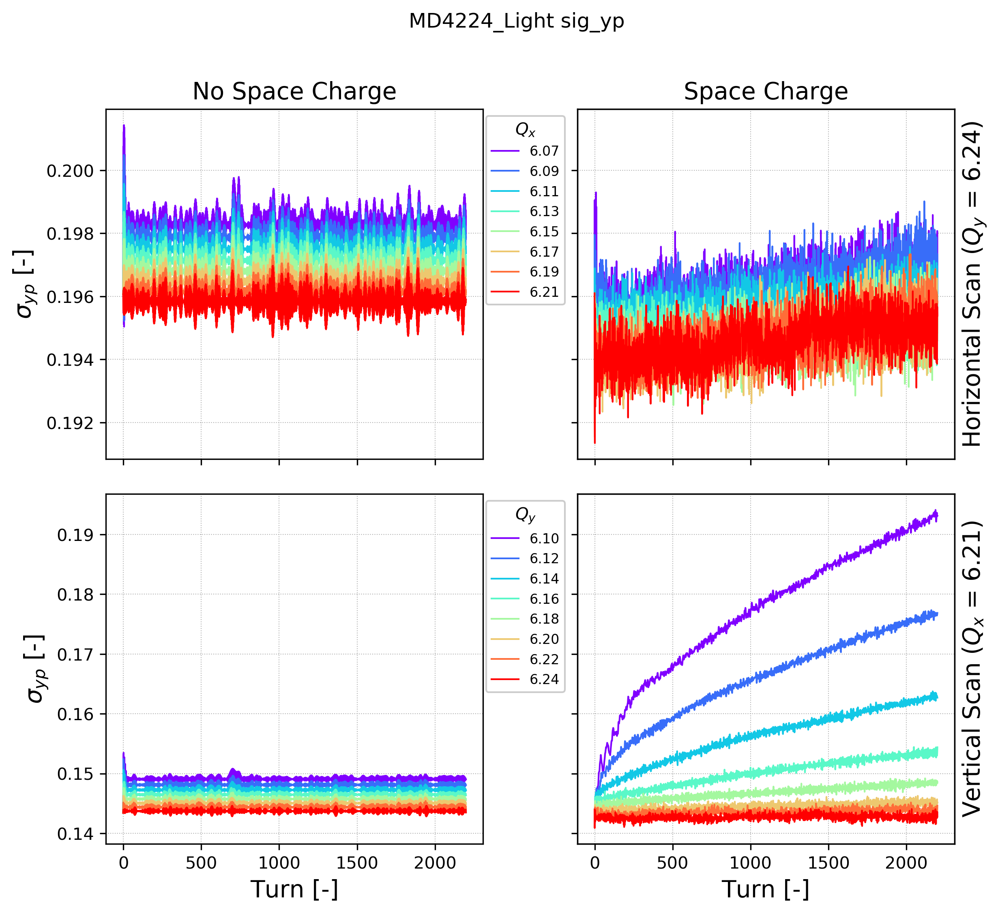

In [22]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_yp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_x  =  21.6  range =  2.09  =  9.68 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_x  =  22.1  range =  1.29  =  5.8500000000000005 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_x  =  22.3  range =  0.8  =  3.58 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_x  =  22.5  range =  0.614  =  2.73 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_x  =  22.6  range =  0.695  =  3.0700000000000003 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  beta_x  =  22.7  range =  0.639  =  2.81 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  beta_x  =  22.8  range =  0.695  =  3.05 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  beta_x  =  22.8  range =  0.699  =  3.06 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_x  =  21.1  range =  7.92  =  37.5 %
Space Ch

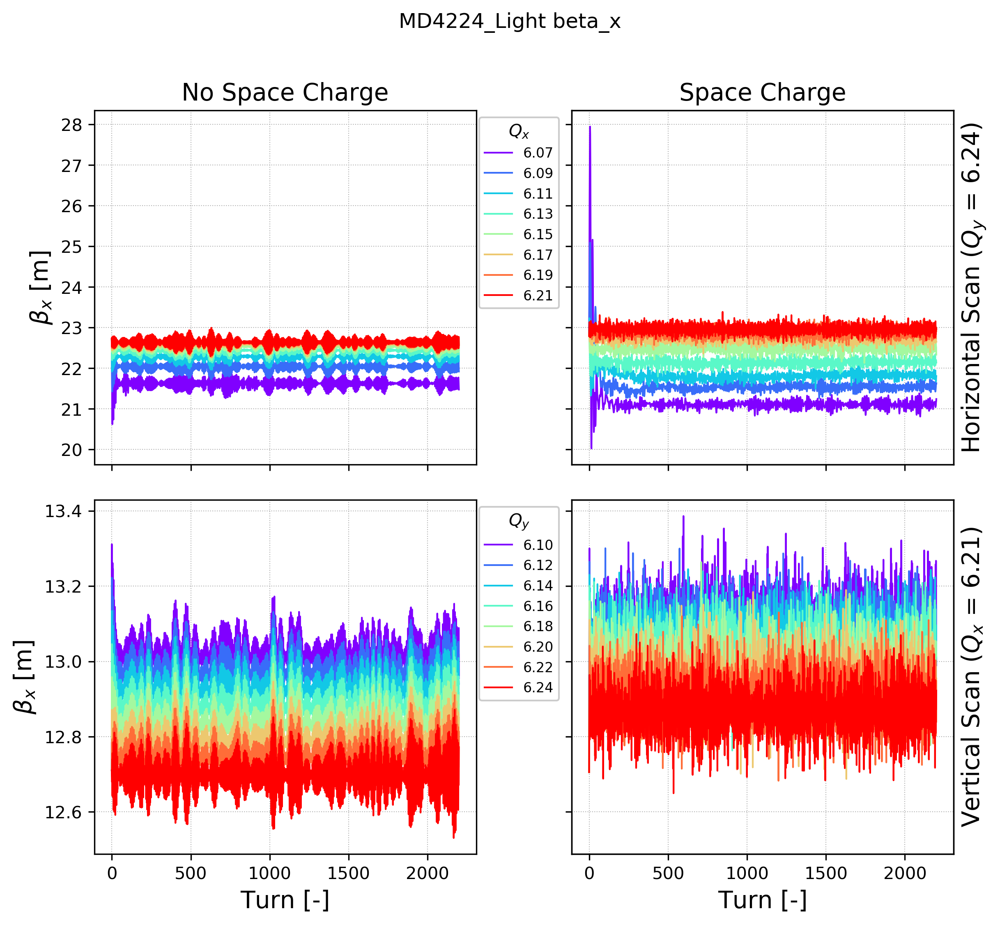

In [23]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_x$ [m]');
ax3.set_ylabel(r'$\beta_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    
ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_y  =  11.2  range =  0.721  =  6.45 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_y  =  11.2  range =  0.599  =  5.33 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_y  =  11.3  range =  0.479  =  4.24 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_y  =  11.3  range =  0.36  =  3.17 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_y  =  11.4  range =  0.279  =  2.45 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  beta_y  =  11.4  range =  0.278  =  2.44 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  beta_y  =  11.5  range =  0.275  =  2.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  beta_y  =  11.5  range =  0.272  =  2.37 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_y  =  11.5  range =  0.671  =  5.81 %
Space Charge   Horizontal Scan ($

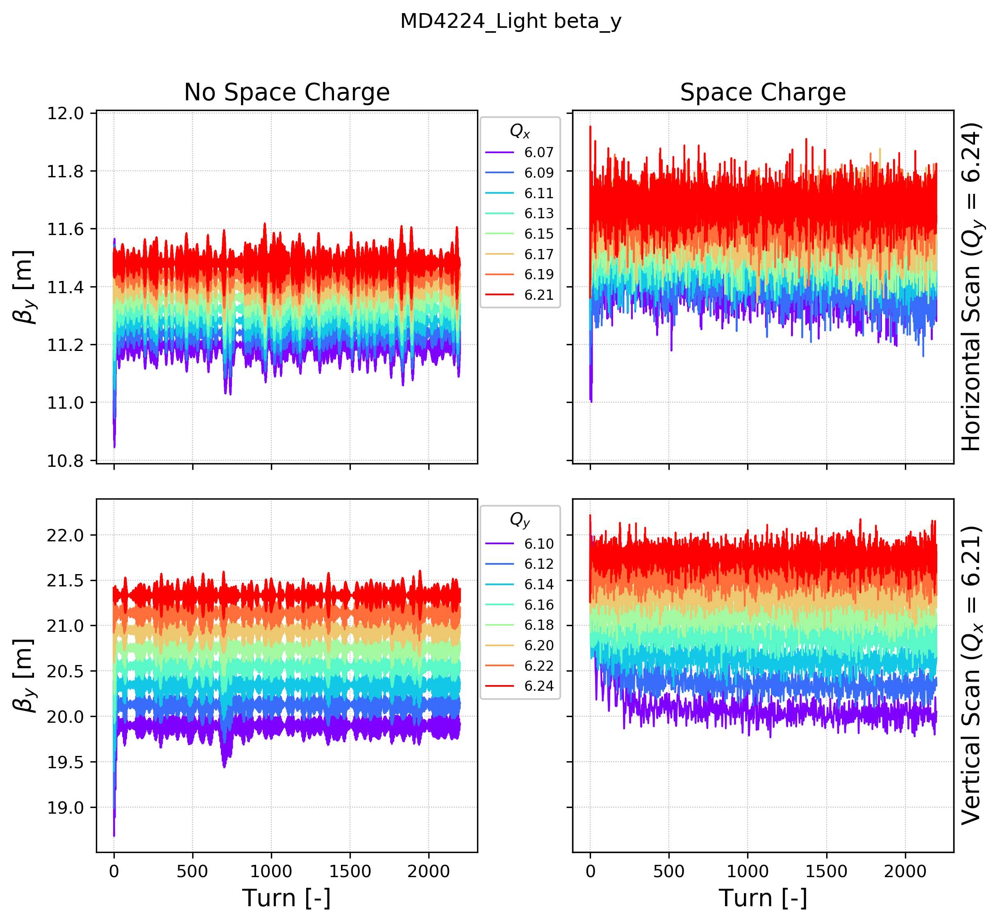

In [24]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_y$ [m]');
ax3.set_ylabel(r'$\beta_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_x  =  3.05  range =  1.81  =  59.5 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_x  =  3.07  range =  1.16  =  37.8 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_x  =  3.08  range =  0.752  =  24.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_x  =  3.08  range =  0.461  =  15.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_x  =  3.07  range =  0.281  =  9.17 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  D_x  =  3.05  range =  0.157  =  5.13 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  D_x  =  3.04  range =  0.121  =  3.9699999999999998 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  D_x  =  3.02  range =  0.123  =  4.05 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_x  =  2.85  range =  5.51  =  193.0 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24) 

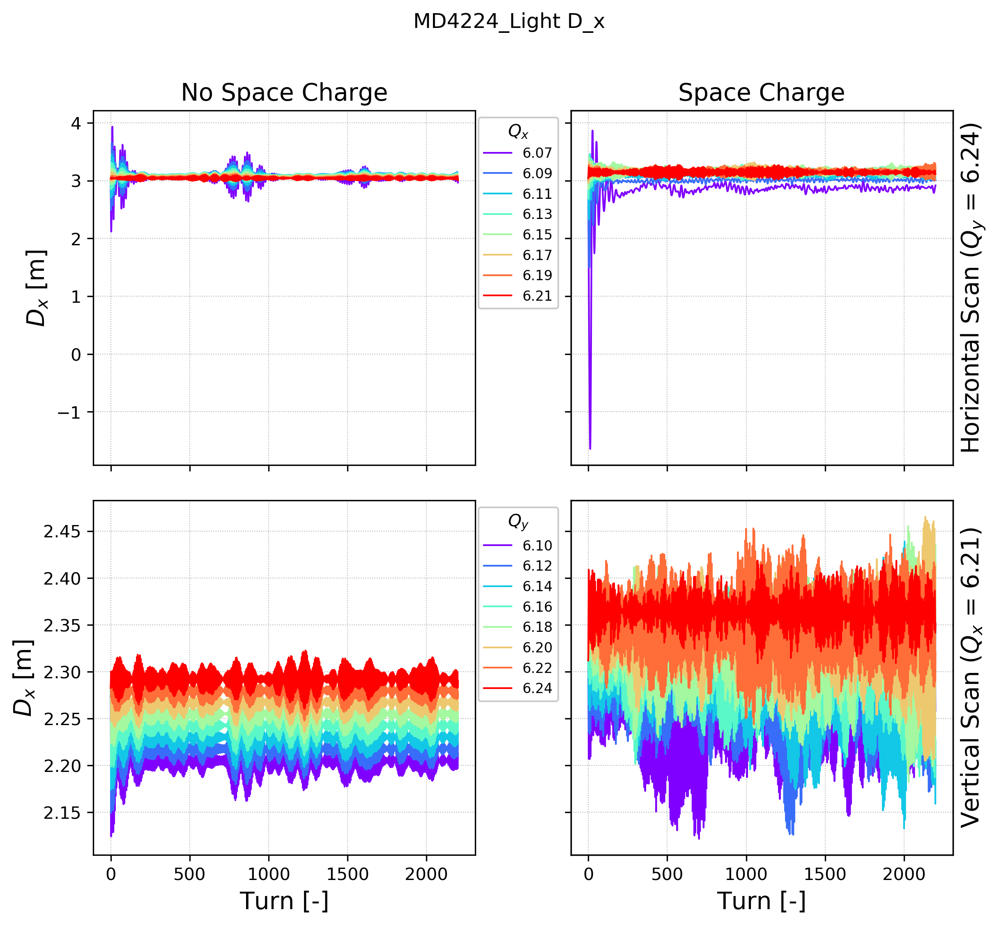

In [25]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_x$ [m]');
ax3.set_ylabel(r'$D_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_y  =  0.00763  range =  0.0729  =  956.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_y  =  0.0063  range =  0.0735  =  1170.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_y  =  0.00527  range =  0.0735  =  1400.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_y  =  0.00461  range =  0.0736  =  1600.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_y  =  0.00425  range =  0.0738  =  1739.9999999999998 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  D_y  =  0.00413  range =  0.0744  =  1800.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  D_y  =  0.00419  range =  0.0751  =  1789.9999999999998 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  D_y  =  0.00438  range =  0.0757  =  1730.0 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_y  =  0.0126  range =  0.0

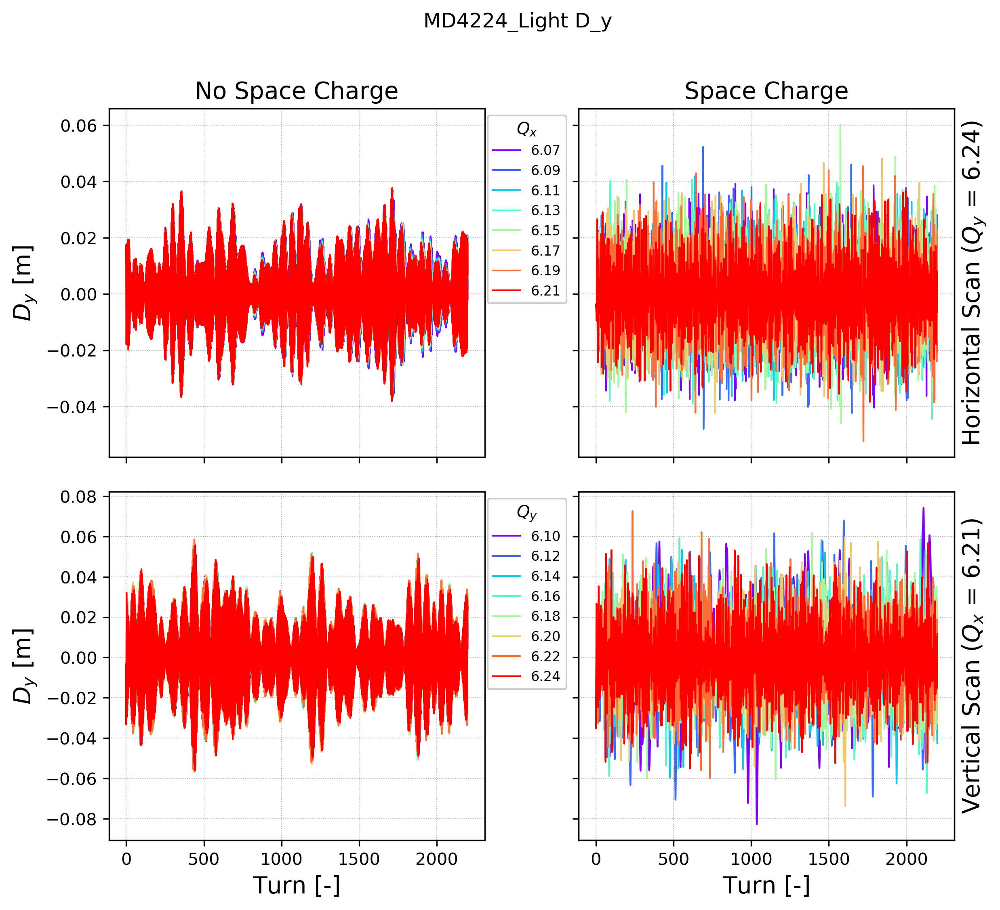

In [26]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_y$ [m]');
ax3.set_ylabel(r'$D_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  dpp_rms  =  0.83  range =  0.00465  =  0.561 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  dpp_rms  =  0.83  range =  0.00438  =  0.528 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  dpp_rms  =  0.829  range =  0.00424  =  0.511 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  dpp_rms  =  0.829  range =  0.0042  =  0.506 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  dpp_rms  =  0.829  range =  0.00423  =  0.51 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  dpp_rms  =  0.829  range =  0.00437  =  0.527 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  dpp_rms  =  0.829  range =  0.00454  =  0.5479999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  dpp_rms  =  0.829  range =  0.00476  =  0.575 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  dpp_rms  =  0.761  range 

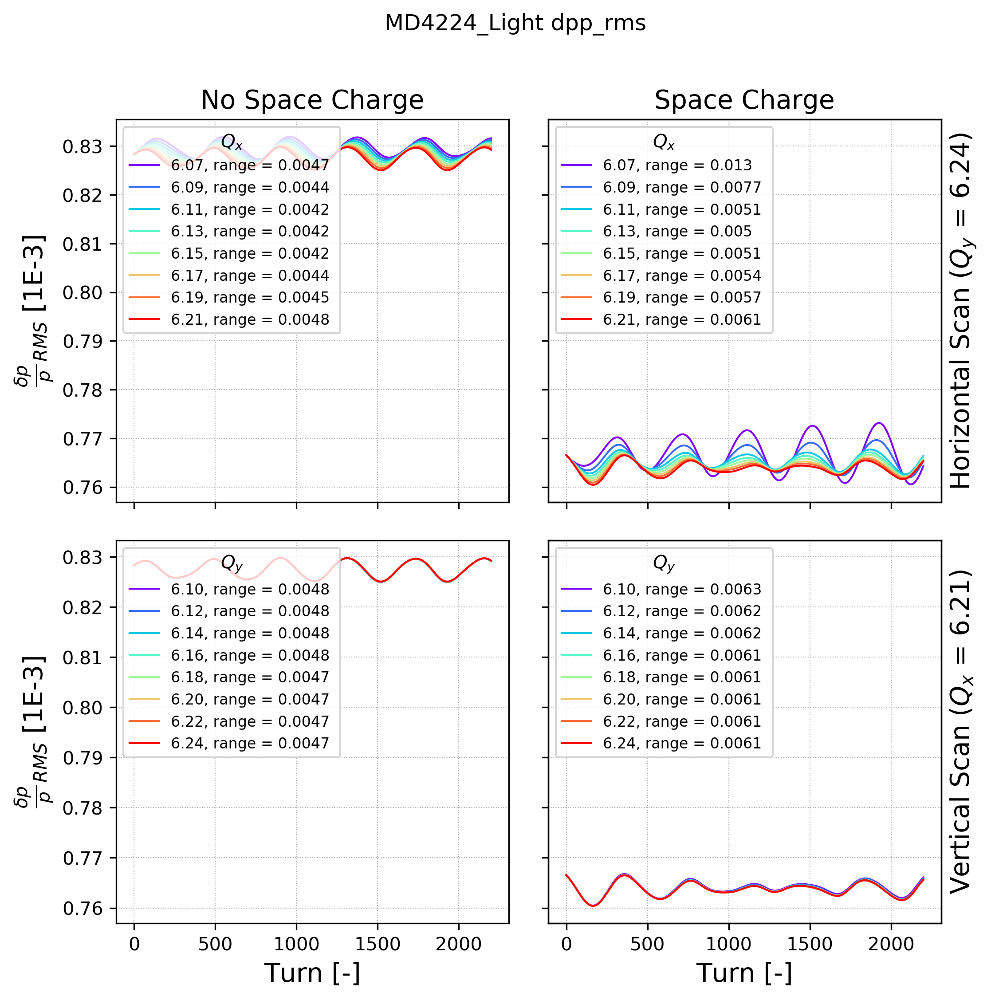

In [27]:
full_labels = True
range_unit = ''
round_sig_limit = 2
parameter = 'dpp_rms'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  bunchlength  =  125.0  range =  0.684  =  0.5479999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  bunchlength  =  125.0  range =  0.646  =  0.517 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  bunchlength  =  125.0  range =  0.629  =  0.503 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  bunchlength  =  125.0  range =  0.624  =  0.49899999999999994 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  bunchlength  =  125.0  range =  0.631  =  0.505 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  bunchlength  =  125.0  range =  0.65  =  0.52 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  bunchlength  =  125.0  range =  0.68  =  0.544 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  bunchlength  =  125.0  range =  0.715  =  0.5720000000000001 %
Space Charge   Horizontal Scan ($Q_y$ = 6.2

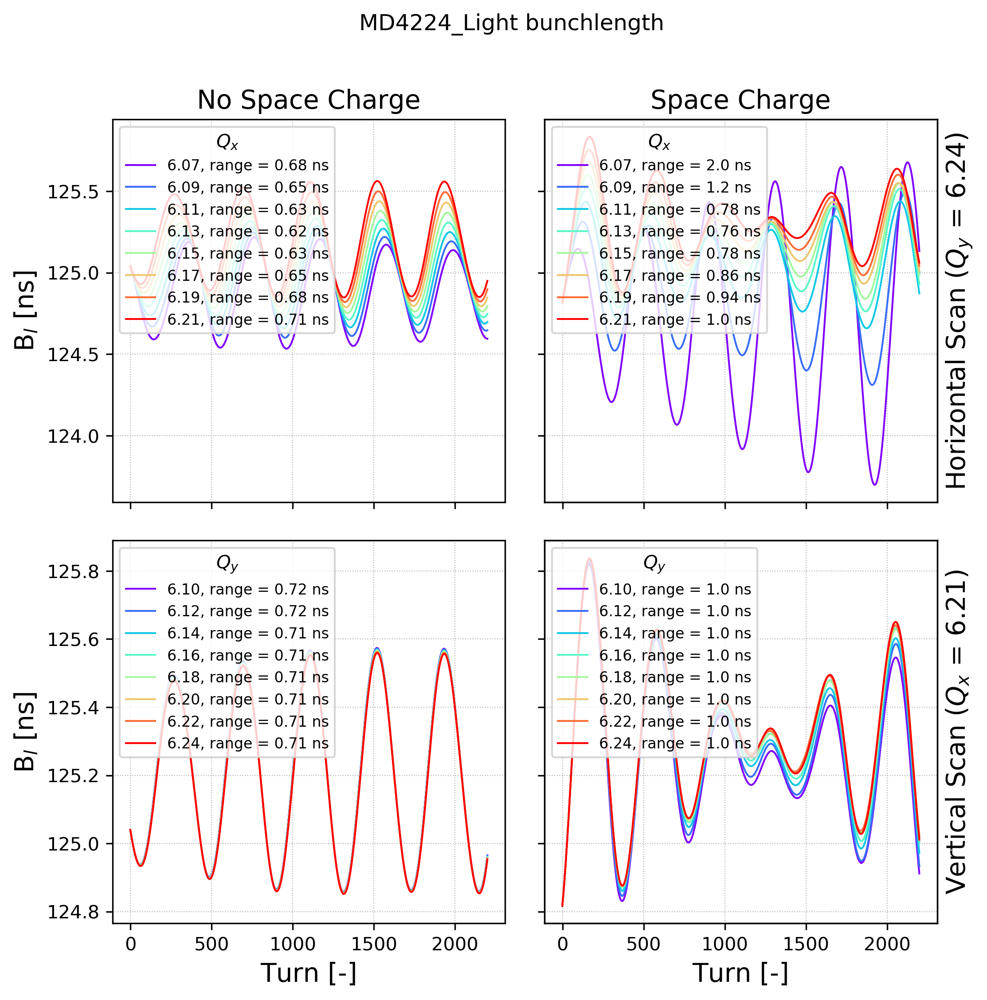

In [28]:
full_labels = True
range_unit = 'ns'
round_sig_limit = 2
parameter = 'bunchlength'
multi1 = 1E9

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'B$_l$ [ns]');
ax3.set_ylabel(r'B$_l$ [ns]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_z  =  8.57  range =  0.047  =  0.5479999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_z  =  8.57  range =  0.0443  =  0.517 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_z  =  8.57  range =  0.0432  =  0.503 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_z  =  8.57  range =  0.0428  =  0.49899999999999994 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_z  =  8.57  range =  0.0433  =  0.505 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  sig_z  =  8.57  range =  0.0446  =  0.52 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  sig_z  =  8.58  range =  0.0466  =  0.544 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  sig_z  =  8.58  range =  0.049  =  0.5720000000000001 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_z  =  8.62  range =  0.13

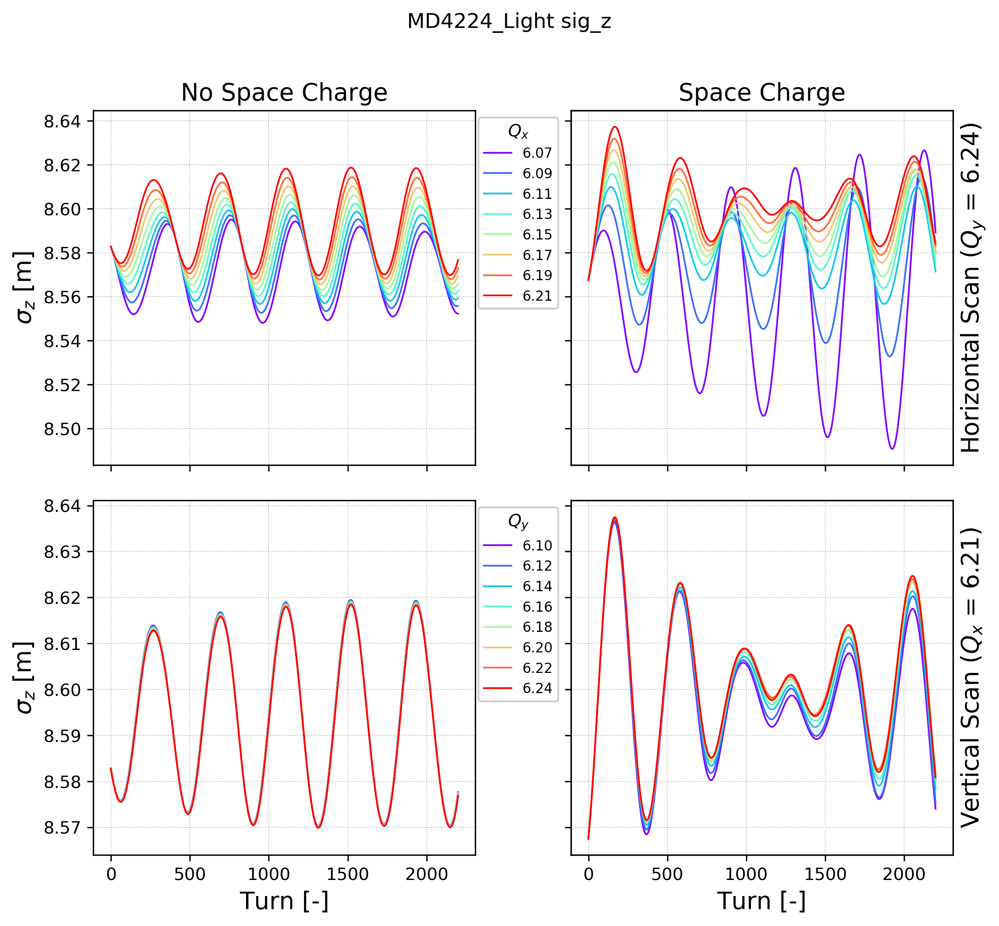

In [29]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_dE  =  1.63  range =  0.00911  =  0.561 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_dE  =  1.63  range =  0.00858  =  0.528 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_dE  =  1.63  range =  0.00831  =  0.511 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_dE  =  1.63  range =  0.00823  =  0.506 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_dE  =  1.63  range =  0.00829  =  0.51 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  sig_dE  =  1.63  range =  0.00856  =  0.527 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  sig_dE  =  1.62  range =  0.00891  =  0.5479999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  sig_dE  =  1.62  range =  0.00933  =  0.575 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_dE  =  1.49  range =  0.0247  =  1

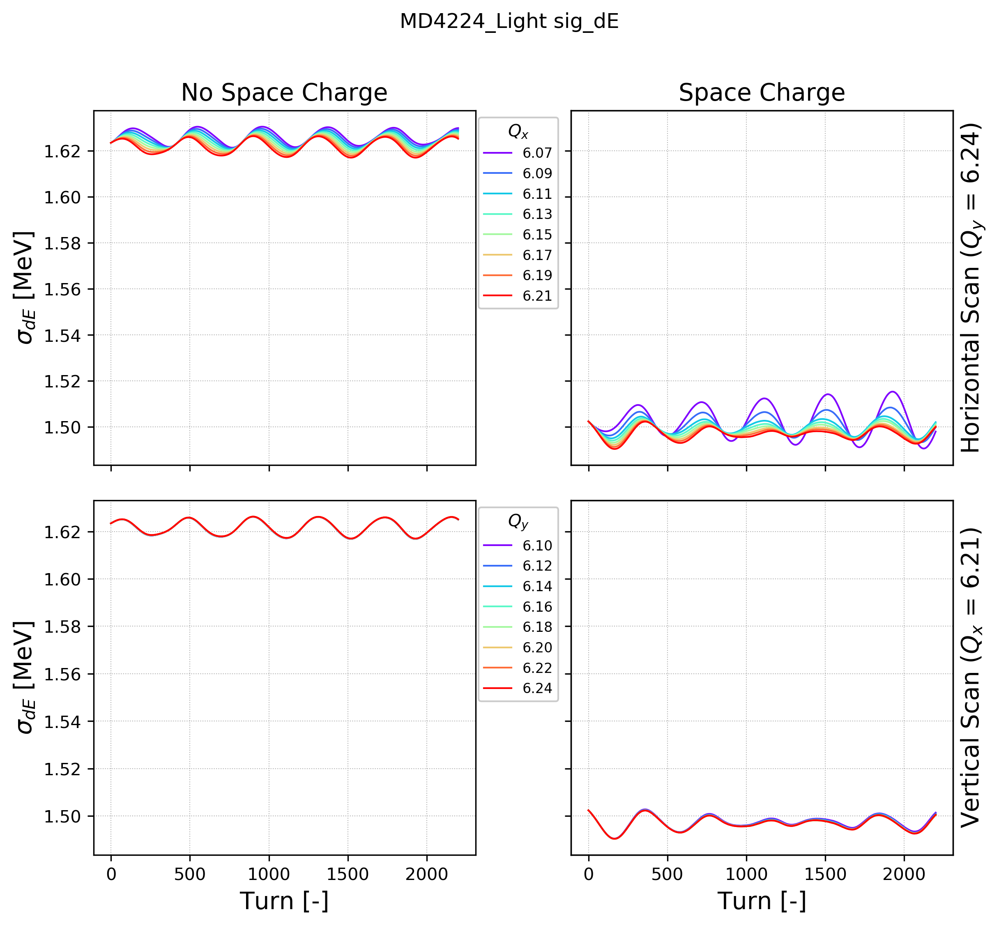

In [30]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_dE'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  eps_z  =  0.638  range =  0.000316  =  0.049600000000000005 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  eps_z  =  0.638  range =  0.000319  =  0.05 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  eps_z  =  0.638  range =  0.000321  =  0.0504 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  eps_z  =  0.638  range =  0.000323  =  0.050699999999999995 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  eps_z  =  0.638  range =  0.000325  =  0.051000000000000004 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  eps_z  =  0.638  range =  0.000327  =  0.0513 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  eps_z  =  0.638  range =  0.000329  =  0.05159999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  eps_z  =  0.638  range =  0.000331  =  0.052 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24

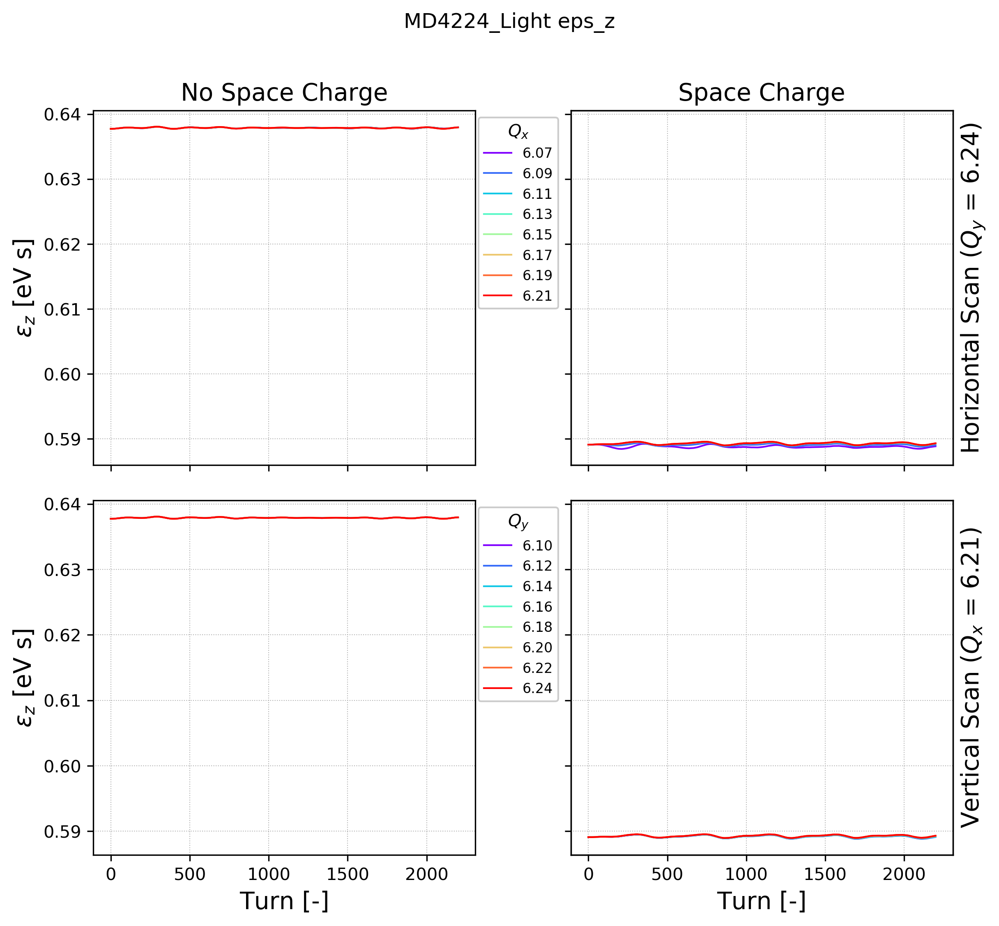

In [31]:
full_labels = False
range_unit = 'eV s'
round_sig_limit = 2
parameter = 'eps_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  1.03  range =  0.0385  =  3.73 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.01  range =  0.0146  =  1.4500000000000002 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.0  range =  0.00593  =  0.592 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  0.998  range =  0.00247  =  0.247 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  0.996  range =  0.000998  =  0.1 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  epsn_x  =  0.996  range =  0.000435  =  0.0437 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  epsn_x  =  0.995  range =  0.000338  =  0.0339 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  epsn_x  =  0.995  range =  0.000333  =  0.0335 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  4.15  range =  3.16 

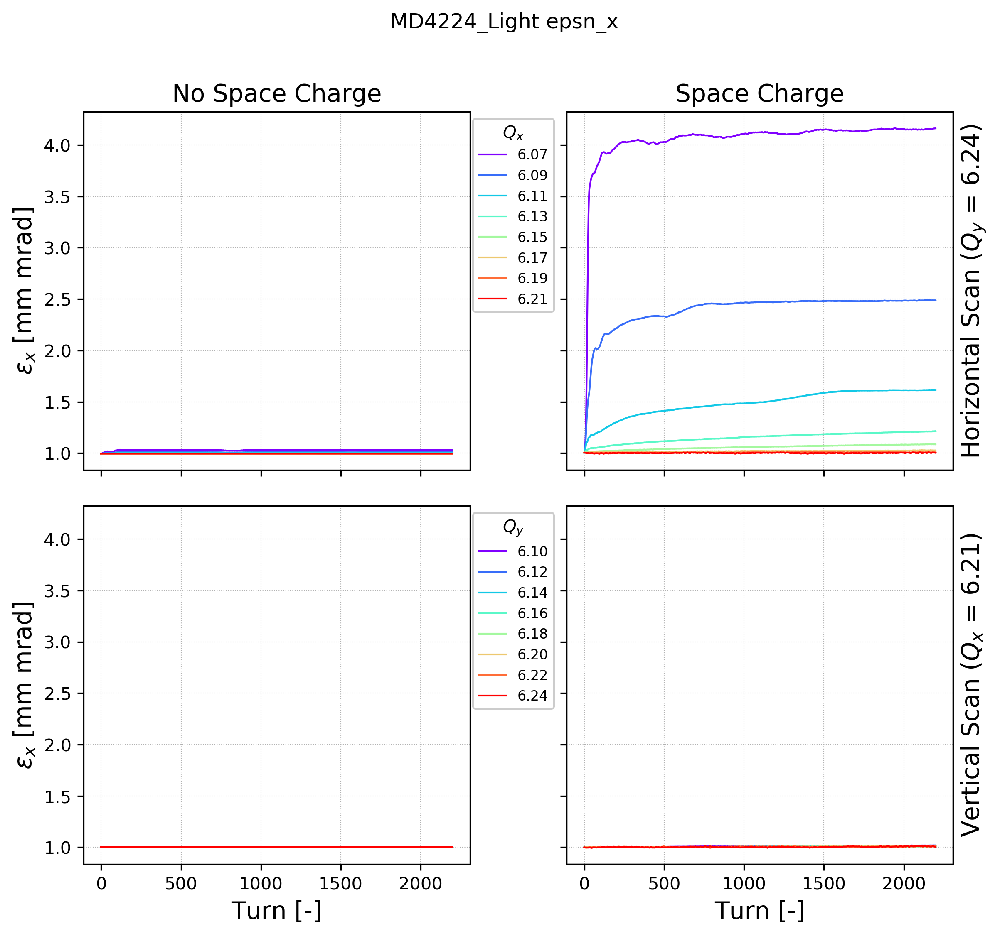

In [32]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_x'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.000718  =  0.07150000000000001 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.000505  =  0.0504 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.0  range =  0.000334  =  0.0333 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  0.000206  =  0.0205 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  0.000148  =  0.0147 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  epsn_y  =  1.0  range =  0.000148  =  0.014799999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  epsn_y  =  1.0  range =  0.000149  =  0.014799999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  epsn_y  =  1.0  range =  0.000158  =  0.0157 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  e

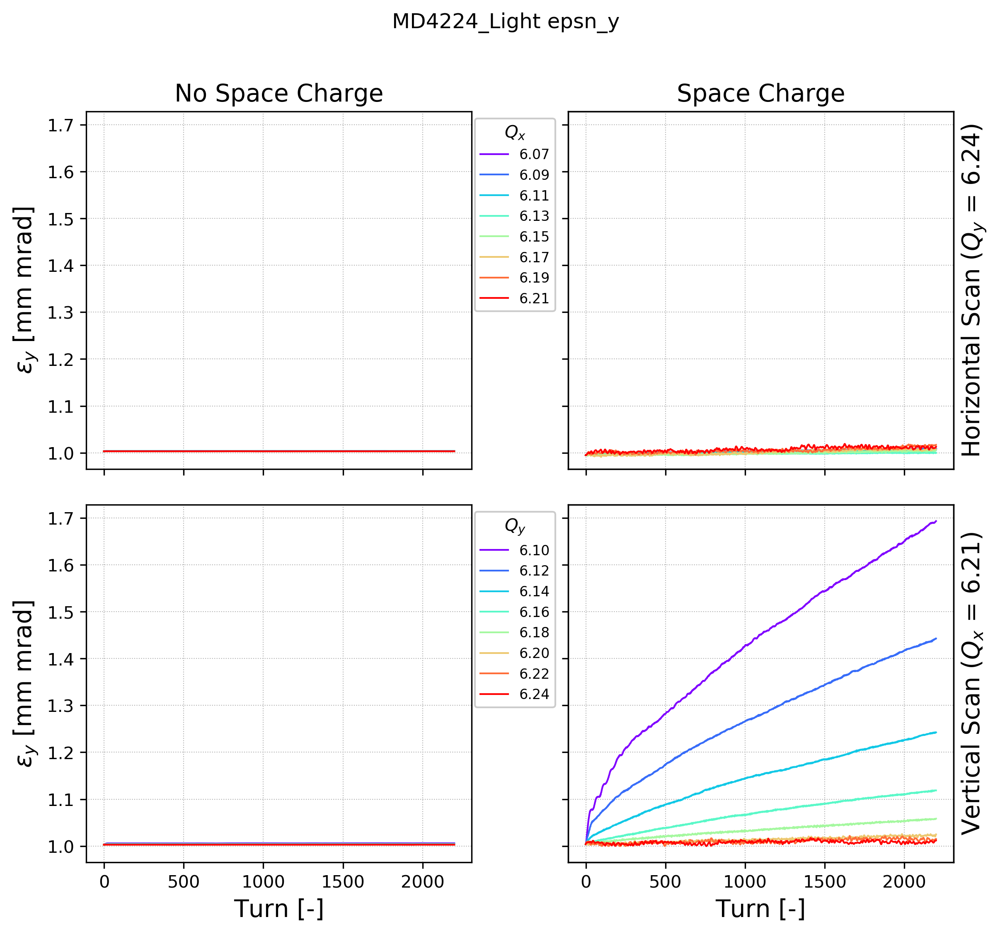

In [33]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_y'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.02  range =  0.0196  =  1.92 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.01  range =  0.00753  =  0.748 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.0  range =  0.0031  =  0.309 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  0.0013  =  0.13 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  0.000536  =  0.0536 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  epsn_y  =  0.999  range =  0.000215  =  0.0215 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  epsn_y  =  0.999  range =  0.000198  =  0.019799999999999998 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  epsn_y  =  0.999  range =  0.000189  =  0.019 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  2.58  range =  1.59  = 

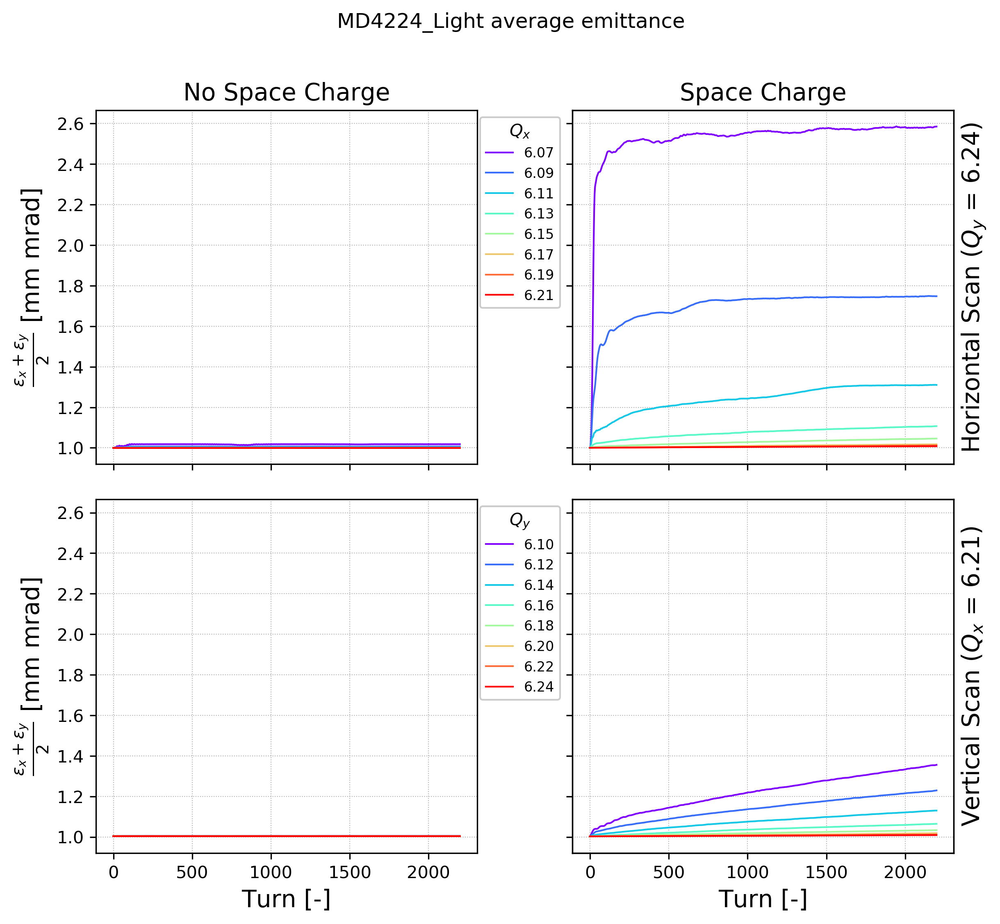

In [34]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2

parameter1 = 'epsn_x'
multi1 = 1E6
parameter2 = 'epsn_y'
multi2 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' average emittance'

fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
    x = np.array(dd1[key]['turn'][0])
    y = np.array((dd1[key][parameter1][0]*multi1 + dd1[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
      

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
    x = np.array(dd2[key]['turn'][0])
    y = np.array((dd2[key][parameter1][0]*multi1 + dd2[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
 
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
    x = np.array(dd3[key]['turn'][0])
    y = np.array((dd3[key][parameter1][0]*multi1 + dd3[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
    x = np.array(dd4[key]['turn'][0])
    y = np.array((dd4[key][parameter1][0]*multi1 + dd4[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_average_emittance.png'
plt.savefig(savename); 

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  1.03  range =  0.0385  =  3.73 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.01  range =  0.0146  =  1.4500000000000002 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.0  range =  0.00593  =  0.592 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  0.998  range =  0.00247  =  0.247 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  0.996  range =  0.000998  =  0.1 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  epsn_x  =  0.996  range =  0.000435  =  0.0437 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  epsn_x  =  0.995  range =  0.000338  =  0.0339 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  epsn_x  =  0.995  range =  0.000333  =  0.0335 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  4.15  range =  3.16 

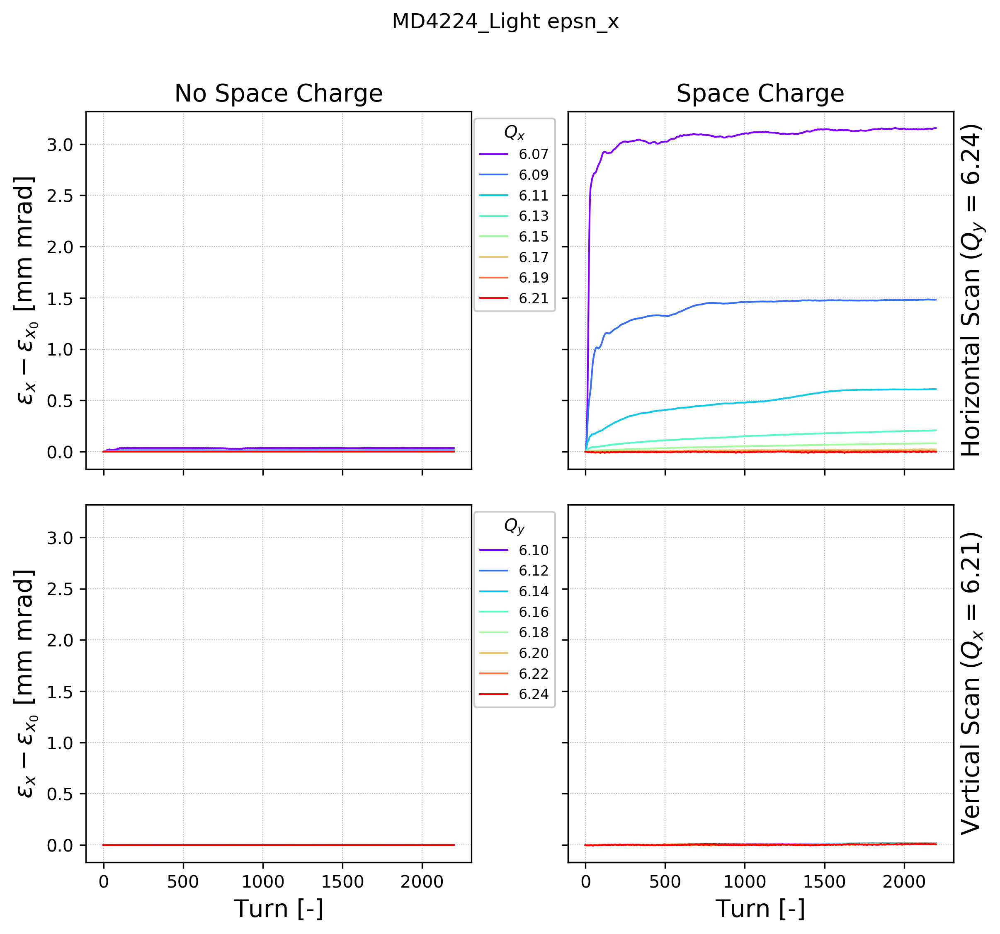

In [36]:
parameter = 'epsn_x'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%' )       
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')      
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')      
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.000718  =  0.07150000000000001 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.000505  =  0.0504 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.0  range =  0.000334  =  0.0333 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  0.000206  =  0.0205 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  0.000148  =  0.0147 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.17 Average  epsn_y  =  1.0  range =  0.000148  =  0.014799999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.19 Average  epsn_y  =  1.0  range =  0.000149  =  0.014799999999999999 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.21 Average  epsn_y  =  1.0  range =  0.000158  =  0.0157 %
Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  e

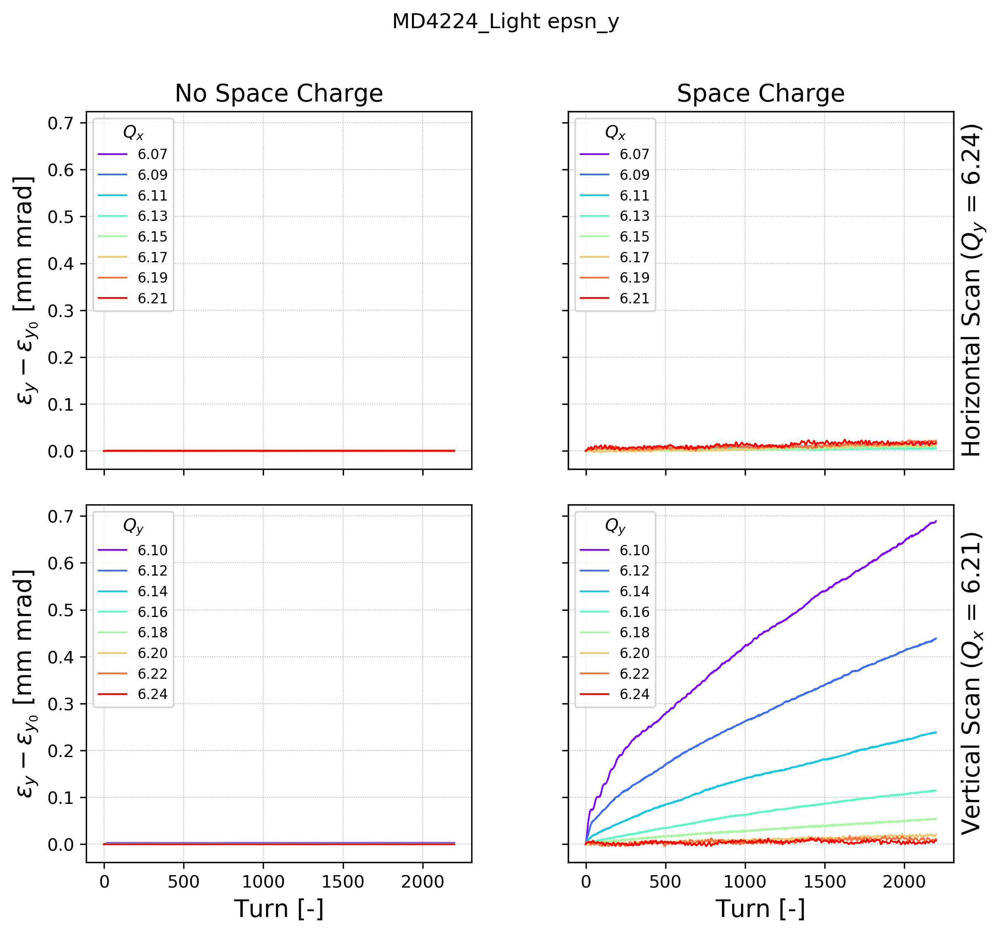

In [37]:
full_labels = True
range_unit = 'mm mrad'
round_sig_limit = 2

parameter = 'epsn_y'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.items()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print(title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.items()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print(title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')       
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.items()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print(title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')     
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.items()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print(title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%')       
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);